In [2]:
from huggingface_hub import notebook_login


notebook_login()

In [3]:
from datasets import load_dataset
from transformers import AutoImageProcessor, ResNetForImageClassification

In [4]:
dataset = load_dataset("Crops_Classification/")

Resolving data files:   0%|          | 0/297 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/84 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/38 [00:00<?, ?it/s]

In [5]:
labels = dataset["train"].features["label"].names
labels

['Banana',
 'Cashew',
 'Coffee',
 'Ginger',
 'Jowar',
 'Mango',
 'Ridge_gourd',
 'Rose',
 'Tomato']

In [6]:
processor = AutoImageProcessor.from_pretrained("microsoft/resnet-50")
model = ResNetForImageClassification.from_pretrained("microsoft/resnet-50")

checkpoint = "google/vit-base-patch16-224-in21k"
image_processor = AutoImageProcessor.from_pretrained(checkpoint)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


In [7]:
labels = dataset["train"].features["label"].names
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = str(i)
    id2label[str(i)] = label

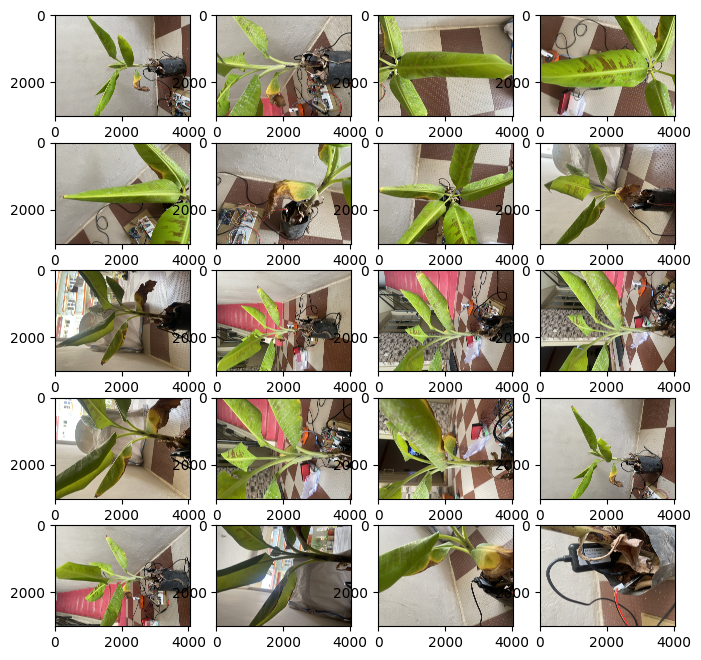

In [8]:
# dataset = load_dataset('imagefolder', data_dir='New Plant Diseases Dataset(Augmented)/train', split='train')
import matplotlib.pyplot as plt
import numpy as np
fig = plt.figure(figsize=(8, 8))
columns = 4
rows = 5
for i in range(1, columns*rows +1):
    img = np.random.randint(10, size=(10,10))
    fig.add_subplot(rows, columns, i)
    plt.imshow(dataset['train'][i]['image'])
plt.show()

In [9]:
from tensorflow import keras
from tensorflow.keras import layers

size = (image_processor.size["height"], image_processor.size["width"])

train_data_augmentation = keras.Sequential(
    [
        layers.RandomCrop(size[0], size[1]),
        layers.Rescaling(scale=1.0 / 127.5, offset=-1),
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(factor=0.02),
        layers.RandomZoom(height_factor=0.2, width_factor=0.2),
    ],
    name="train_data_augmentation",
)

val_data_augmentation = keras.Sequential(
    [
        layers.CenterCrop(size[0], size[1]),
        layers.Rescaling(scale=1.0 / 127.5, offset=-1),
    ],
    name="val_data_augmentation",
)

In [10]:
import numpy as np
import tensorflow as tf
from PIL import Image


def convert_to_tf_tensor(image: Image):
    np_image = np.array(image)
    tf_image = tf.convert_to_tensor(np_image)
    # `expand_dims()` is used to add a batch dimension since
    # the TF augmentation layers operates on batched inputs.
    return tf.expand_dims(tf_image, 0)


def preprocess_train(example_batch):
    """Apply train_transforms across a batch."""
    images = [
        train_data_augmentation(convert_to_tf_tensor(image.convert("RGB"))) for image in example_batch["image"]
    ]
    example_batch["pixel_values"] = [tf.transpose(tf.squeeze(image)) for image in images]
    return example_batch


def preprocess_val(example_batch):
    """Apply val_transforms across a batch."""
    images = [
        val_data_augmentation(convert_to_tf_tensor(image.convert("RGB"))) for image in example_batch["image"]
    ]
    example_batch["pixel_values"] = [tf.transpose(tf.squeeze(image)) for image in images]
    return example_batch

In [11]:
dataset["train"].set_transform(preprocess_train)
dataset["validation"].set_transform(preprocess_val)

In [12]:
from transformers import DefaultDataCollator

data_collator = DefaultDataCollator(return_tensors="tf")

In [13]:
import evaluate

accuracy = evaluate.load("accuracy")

import numpy as np


def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return accuracy.compute(predictions=predictions, references=labels)

In [14]:
from transformers import create_optimizer

batch_size = 16
num_epochs = 1
num_train_steps = len(dataset["train"]) * num_epochs
learning_rate = 3e-5
weight_decay_rate = 0.01

optimizer, lr_schedule = create_optimizer(
    init_lr=learning_rate,
    num_train_steps=num_train_steps,
    weight_decay_rate=weight_decay_rate,
    num_warmup_steps=0,
)

In [15]:
from transformers import TFAutoModelForImageClassification

model = TFAutoModelForImageClassification.from_pretrained(
    checkpoint,
    id2label=id2label,
    label2id=label2id,
)

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFViTForImageClassification: ['pooler.dense.bias', 'pooler.dense.weight']
- This IS expected if you are initializing TFViTForImageClassification from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFViTForImageClassification from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFViTForImageClassification were not initialized from the PyTorch model and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [16]:
# converting our train dataset to tf.data.Dataset
tf_train_dataset = dataset["train"].to_tf_dataset(
    columns="pixel_values", label_cols="label", shuffle=True, batch_size=batch_size, collate_fn=data_collator
)

# converting our test dataset to tf.data.Dataset
tf_eval_dataset = dataset["validation"].to_tf_dataset(
    columns="pixel_values", label_cols="label", shuffle=True, batch_size=batch_size, collate_fn=data_collator
)

In [17]:
from tensorflow.keras.losses import SparseCategoricalCrossentropy

loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
model.compile(optimizer=optimizer, loss=loss)

In [18]:
from transformers.keras_callbacks import KerasMetricCallback, PushToHubCallback

metric_callback = KerasMetricCallback(metric_fn=compute_metrics, eval_dataset=tf_eval_dataset)
push_to_hub_callback = PushToHubCallback(
    output_dir="plant_classifier",
    tokenizer=image_processor,
    save_strategy="no",
)
callbacks = [metric_callback, push_to_hub_callback]

C:\Users\supri\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\utils\_deprecation.py:127: FutureWarning: 'Repository' (from 'huggingface_hub.repository') is deprecated and will be removed from version '1.0'. Please prefer the http-based alternatives instead. Given its large adoption in legacy code, the complete removal is only planned on next major release.
For more details, please read https://huggingface.co/docs/huggingface_hub/concepts/git_vs_http.
  warnings.warn(warning_message, FutureWarning)
G:\plant_classifier is already a clone of https://huggingface.co/suprith777/plant_classifier. Make sure you pull the latest changes with `repo.git_pull()`.


In [20]:
model.fit(tf_train_dataset, validation_data=tf_eval_dataset, epochs=num_epochs, callbacks=callbacks)

Several commits (3) will be pushed upstream.
The progress bars may be unreliable.


Upload file tf_model.h5:   0%|          | 1.00/328M [00:00<?, ?B/s]

To https://huggingface.co/suprith777/plant_classifier
   cdf3a55..2083713  main -> main



In [23]:
from transformers import pipeline

image = Image.open("./tomato_test.jpg")
classifier = pipeline("image-classification", model="plant_classifier")
classifier(image)

All model checkpoint layers were used when initializing TFViTForImageClassification.

All the layers of TFViTForImageClassification were initialized from the model checkpoint at plant_classifier.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFViTForImageClassification for predictions without further training.


[{'score': 0.2400629222393036, 'label': 'Ridge_gourd'},
 {'score': 0.1625054031610489, 'label': 'Jowar'},
 {'score': 0.09740282595157623, 'label': 'Rose'},
 {'score': 0.0933268666267395, 'label': 'Ginger'},
 {'score': 0.092845618724823, 'label': 'Banana'}]

In [36]:
label2id.values()

dict_values(['0', '1', '2', '3', '4', '5', '6', '7', '8'])

Using the latest cached version of the module from C:\Users\supri\.cache\huggingface\modules\evaluate_modules\metrics\evaluate-metric--accuracy\f887c0aab52c2d38e1f8a215681126379eca617f96c447638f751434e8e65b14 (last modified on Wed May 15 23:33:27 2024) since it couldn't be found locally at evaluate-metric--accuracy, or remotely on the Hugging Face Hub.


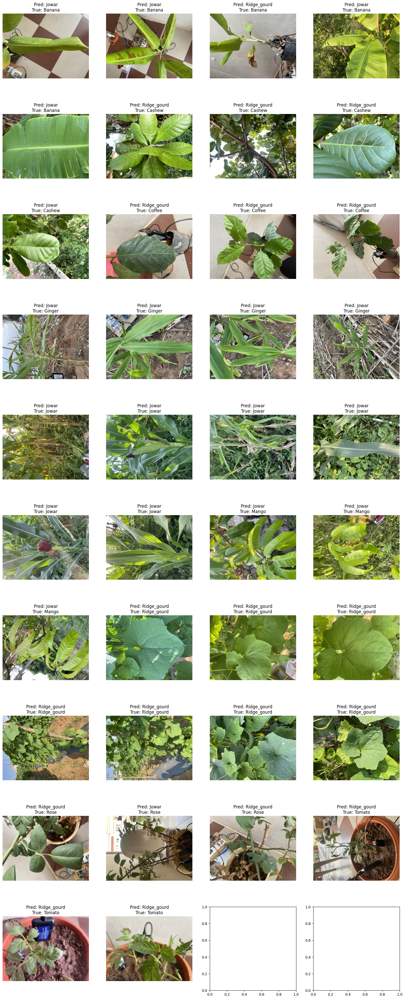

In [38]:
from evaluate import load
from PIL import Image
import os
import matplotlib.pyplot as plt

# Load the accuracy metric
accuracy = load("accuracy")

# Path to the test folder
test_folder = "./Crops_Classification/test/"

# Initialize lists to store true labels and predicted labels
true_labels = []
predicted_labels = []

# Prepare for displaying images
fig, axs = plt.subplots(10, 4, figsize=(20, 50))
axs = axs.flatten()
img_index = 0

# Iterate through the test data
for plant_folder in os.listdir(test_folder):
    plant_path = os.path.join(test_folder, plant_folder)
    if os.path.isdir(plant_path):
        for image_file in os.listdir(plant_path):
            image_path = os.path.join(plant_path, image_file)
            # Load the image
            image = Image.open(image_path)
            # Apply the classifier to obtain predictions
            predictions = classifier(image)
            # Extract the predicted label with the highest score
            predicted_label = max(predictions, key=lambda x: x['score'])['label']
            # Append the true label (extracted from the folder name) and predicted label
            true_labels.append(label2id[plant_folder])
            predicted_labels.append(label2id[predicted_label])
            
            # Display the image with the predicted class
            if img_index < len(axs):
                axs[img_index].imshow(image)
                axs[img_index].set_title(f"Pred: {predicted_label}\nTrue: {plant_folder}")
                axs[img_index].axis('off')
                img_index += 1

# Compute the accuracy score
accuracy_score = accuracy.compute(predictions=predicted_labels, references=true_labels)
plt.show()
print(f'Accuracy: {accuracy_score["accuracy"]}')
